**Created by Sanskar Hasija**

**[PLAYGROUND S-3,E-4] 📊EDA + MODELLING📈**

**24 January 2023**


# <center> [Playground S-3,E-4] 📊EDA + Modelling📈 </center>
## <center>If you find this notebook useful, support with an upvote👍</center>

# Table of Contents
<a id="toc"></a>
- [1. Introduction](#1)
- [2. Imports](#2)
- [3. Data Loading and Preperation](#3)
    - [3.1 Exploring Train Data](#3.1)
    - [3.2 Exploring Test Data](#3.2)
    - [3.3 Submission File](#3.3)
- [4. EDA](#4)
    - [4.1 Overview of Data](#4.1)
    - [4.3 Continuos and Categorical Data Distribution](#4.2)
    - [4.4 Feature Distribution of Continous Features](#4.3)
    - [4.5 Feature Distribution of Categorical Features](#4.4)
    - [4.6 Target Distribution ](#4.5)
- [5. Data Cleaning and Processing ](#5)   
- [6. Modelling](#6)
    - [6.1 LGBM Classifier](#6.1)
    - [6.2 XGBoost Classifier](#6.2)
- [7. Submission](#7)  

<a id="1"></a>
# **<center><span style="color:#00BFC4;">Introduction  </span></center>**

![](https://storage.googleapis.com/kaggle-competitions/kaggle/44632/logos/header.png?t=2022-12-21-20-51-50)

**The competition is organised by `Kaggle` and is in the `Playground Series Season 3 ` series.**


**The task of this compeition is to predict the probability for the target variable `Class` using synthetic data from a Credit Card Fraud Detection. The dataset used for this compeition is derived from this [Orginal Dataset](https://www.kaggle.com/datasets/mlg-ulb/creditcardfraud).**

**Submissions are evaluated based on  <u>Area under the ROC curve.</u>**

<a href="#toc" role="button" aria-pressed="true" >⬆️Back to Table of Contents ⬆️</a>

<a id="2"></a>
# **<center><span style="color:#00BFC4;">Imports  </span></center>**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go


from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split



from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier


from matplotlib import ticker
import time
import warnings
warnings.filterwarnings('ignore')

<a href="#toc" role="button" aria-pressed="true" >⬆️Back to Table of Contents ⬆️</a>

<a id="3"></a>
# **<center><span style="color:#00BFC4;">Data Loading and Preparation </span></center>**

In [2]:
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")
submission = pd.read_csv("sample_submission.csv")

RANDOM_STATE = 12 
FOLDS = 5
STRATEGY = 'median'

## <span style="color:#e76f51;"> Column Descriptions  : </span>


- `Id` - A unique Id for each row. 
- `Time` - Number of seconds elapsed between this transaction and the first transaction in the dataset
- `V1-V28` - Features with dimensionality reduction to protect user identities and sensitive features(v1-v28)
- `Amount` - Transaction amount
- `Class` - Target Class (1 for fraudulent transactions, 0 otherwise)



<a id="3.1"></a>
## <span style="color:#e76f51;"> Exploring Train Data : </span>

<div class="alert alert-block alert-info" style="font-size:14px; font-family:verdana; line-height: 1.7em;">
    📌 &nbsp;<b><u>Observations in Train Data:</u></b><br>
 
* <i> There are total of <b><u>32</u></b> columns and <b><u>219129</u></b> rows in <b><u>train</u></b> data.</i><br>
* <i> Train data contains <b><u>7012128</u></b> values with <b><u>0</u></b>  missing values.</i><br>
* <i></i>There are total of <b><u>32</u></b> columns : <b><u>30</u></b> continous , <b><u>0</u></b> categorical <b><u>1</u></b> id and <b><u>1</u></b> target column<br>
* <i> <b><u>Class</u></b> is the target variable which is only available in the <b><u>train</u></b> dataset.</i><br>
* <i> <b><u>No Missing </u></b> values in the <b><u>train</u></b> dataset.</i><br>
</div>

### <span style="color:#e76f51;"> Quick view of Train Data : </span>

Below are the first 5 rows of train dataset:

In [3]:
train.head()

,id,Time,V1,V2,V3,V4,V5,V6,V7,V8,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0,0.0,2.074329,-0.129425,-1.137418,0.412846,-0.192638,-1.210144,0.110697,-0.263477,...,-0.334701,-0.887840,0.336701,-0.110835,-0.291459,0.207733,-0.076576,-0.059577,1.98,0
1,1,0.0,1.998827,-1.250891,-0.520969,-0.894539,-1.122528,-0.270866,-1.029289,0.050198,...,0.054848,-0.038367,0.133518,-0.461928,-0.465491,-0.464655,-0.009413,-0.038238,84.00,0
2,2,0.0,0.091535,1.004517,-0.223445,-0.435249,0.667548,-0.988351,0.948146,-0.084789,...,-0.326725,-0.803736,0.154495,0.951233,-0.506919,0.085046,0.224458,0.087356,2.69,0
3,3,0.0,1.979649,-0.184949,-1.064206,0.120125,-0.215238,-0.648829,-0.087826,-0.035367,...,-0.095514,-0.079792,0.167701,-0.042939,0.000799,-0.096148,-0.057780,-0.073839,1.00,0
4,4,0.0,1.025898,-0.171827,1.203717,1.243900,-0.636572,1.099074,-0.938651,0.569239,...,0.099157,0.608908,0.027901,-0.262813,0.257834,-0.252829,0.108338,0.021051,1.00,0


In [4]:
print(f'\033[94mNumber of rows in train data: {train.shape[0]}')
print(f'\033[94mNumber of columns in train data: {train.shape[1]}')
print(f'\033[94mNumber of values in train data: {train.count().sum()}')
print(f'\033[94mNumber missing values in train data: {sum(train.isna().sum())}')

Number of rows in train data: 219129
Number of columns in train data: 32
Number of values in train data: 7012128
Number missing values in train data: 0


### <span style="color:#e76f51;"> Basic statistics of training data : </span>

Below is the basic statistics for each variables which contain information on `count`, `mean`, `standard deviation`, `minimum`, `1st quartile`, `median`, `3rd quartile` and `maximum`.

In [5]:
train.describe()

,id,Time,V1,V2,V3,V4,V5,V6,V7,V8,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,...,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000
mean,109564.000000,62377.415376,0.096008,0.048345,0.592102,0.069273,-0.161555,0.133688,-0.128224,0.149534,...,-0.031064,-0.050852,-0.050531,-0.002992,0.124005,0.009881,0.014034,0.017313,66.359803,0.002140
std,63257.237906,25620.348569,1.395425,1.159805,1.132884,1.253125,1.069530,1.202411,0.817207,0.716212,...,0.422777,0.597812,0.318175,0.593100,0.406741,0.473867,0.233355,0.164859,150.795017,0.046214
min,0.000000,0.000000,-29.807725,-44.247914,-19.722872,-5.263650,-37.591259,-25.659750,-31.179799,-28.903442,...,-14.689621,-8.748979,-11.958588,-2.836285,-3.958591,-1.858672,-9.234767,-4.551680,0.000000,0.000000
25%,54782.000000,47933.000000,-0.846135,-0.573728,-0.027154,-0.769256,-0.847346,-0.631835,-0.646730,-0.095948,...,-0.190418,-0.473099,-0.174478,-0.332540,-0.126080,-0.318330,-0.050983,-0.009512,5.990000,0.000000
50%,109564.000000,63189.000000,0.385913,0.046937,0.735895,0.064856,-0.229929,-0.087778,-0.098970,0.111219,...,-0.042858,-0.032856,-0.063307,0.038708,0.145934,-0.086388,0.015905,0.022163,21.900000,0.000000
75%,164346.000000,77519.000000,1.190661,0.814145,1.306110,0.919353,0.356856,0.482388,0.385567,0.390976,...,0.109187,0.354910,0.060221,0.394566,0.402926,0.253869,0.076814,0.066987,68.930000,0.000000
max,219128.000000,120580.000000,2.430494,16.068473,6.145578,12.547997,34.581260,16.233967,39.824099,18.270586,...,22.062945,6.163541,12.734391,4.572739,3.111624,3.402344,13.123618,23.263746,7475.000000,1.000000


<a id="3.2"></a>
## <span style="color:#e76f51;"> Exploring Test Data </span>

<div class="alert alert-block alert-info" style="font-size:14px; font-family:verdana; line-height: 1.7em;">
    📌 &nbsp;<b><u>Observations in Test Data:</u></b><br>
 
* <i> There are total of <b><u>31</u></b> columns and <b><u>146087</u></b> rows in <b><u>test</u></b> data.</i><br>
* <i> Train data contains <b><u>4528697</u></b> observation with <b><u>0</u></b>  missing values.</i><br>
* <i></i>There are total of <b><u>31</u></b> columns : <b><u>30</u></b> continous , <b><u>0</u></b> categorical <b><u>1</u></b> id column<br>
* <i> <b><u>No Missing </u></b> values in the <b><u>test</u></b> dataset as well.</i>
</div>

### <span style="color:#e76f51;"> Quick view of Test Data </span>

In [6]:
test.head()

,id,Time,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,219129,120580.0,2.115519,-0.691809,-1.305514,-0.685655,-0.641265,-0.764784,-0.924262,-0.023030,...,0.067367,0.241708,0.682524,0.037769,-0.546859,-0.123055,-0.084889,0.004720,-0.021944,29.95
1,219130,120580.0,1.743525,-1.681429,-0.547387,-1.061113,-0.695825,2.458824,-1.632859,1.073529,...,0.441788,0.543278,1.294571,0.309541,3.703925,-0.242579,0.068708,0.002629,0.064690,163.50
2,219131,120580.0,2.205568,-1.571445,-0.238965,-1.662517,-1.652324,-0.054701,-1.682064,0.105613,...,-0.366906,-0.131527,0.086623,0.291375,0.739087,-0.543006,-0.297813,0.043699,-0.037855,16.00
3,219132,120580.0,1.989728,-0.972909,-1.938259,-1.440129,-0.166855,-0.794048,0.252889,-0.399789,...,-0.049136,-0.080115,-0.010732,-0.038550,0.656830,0.343470,-0.627529,-0.024338,-0.036143,120.98
4,219133,120580.0,-1.943548,-1.668761,0.363601,-0.977610,2.684779,-2.037681,0.039709,-0.048895,...,0.391627,0.083389,-0.306918,0.247822,-0.391799,-0.790716,-0.025706,0.330758,0.335537,1.98


In [7]:
print(f'\033[94mNumber of rows in test data: {test.shape[0]}')
print(f'\033[94mNumber of columns in test data: {test.shape[1]}')
print(f'\033[94mNumber of values in train data: {test.count().sum()}')
print(f'\033[94mNo of rows with missing values  in test data: {sum(test.isna().sum())}')

Number of rows in test data: 146087
Number of columns in test data: 31
Number of values in train data: 4528697
No of rows with missing values  in test data: 0


### <span style="color:#e76f51;"> Basic statistics of test data </span>

Below is the basic statistics for each variables which contain information on `count`, `mean`, `standard deviation`, `minimum`, `1st quartile`, `median`, `3rd quartile` and `maximum`.

In [8]:
test.describe()

,id,Time,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
count,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,...,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000
mean,292172.000000,144637.928166,0.512929,-0.013098,-0.697478,-0.273258,0.321856,-0.050204,0.073419,0.043803,...,-0.056678,0.044729,0.175461,0.018471,0.016029,-0.118352,-0.015199,0.006236,0.002035,66.182463
std,42171.828725,14258.025396,1.628455,1.247749,1.292522,1.365752,1.146215,1.332880,0.946681,0.749513,...,0.458364,0.449017,0.710704,0.359597,0.633929,0.479720,0.446154,0.255935,0.174613,153.151535
min,219129.000000,120580.000000,-34.755944,-37.803827,-18.934952,-5.497560,-25.639591,-14.133040,-18.715915,-26.926164,...,-26.412867,-13.087263,-5.392649,-12.814296,-2.789084,-3.361564,-1.743223,-9.412538,-8.262339,0.000000
25%,255650.500000,132698.000000,-0.679988,-0.715885,-1.619268,-1.021205,-0.418547,-0.891441,-0.570042,-0.231824,...,-0.237529,-0.166715,-0.393667,-0.135059,-0.368957,-0.409938,-0.284914,-0.066037,-0.057447,5.990000
50%,292172.000000,144493.000000,0.285798,0.009058,-0.719060,-0.482945,0.306851,-0.372813,0.118545,0.014979,...,-0.096729,0.058393,0.250169,0.017835,0.029727,-0.142325,-0.069342,-0.003539,-0.026955,21.790000
75%,328693.500000,156140.000000,1.974015,0.827420,0.073874,0.369725,0.955997,0.302724,0.734503,0.296969,...,0.065753,0.244817,0.749555,0.167514,0.562138,0.182937,0.216632,0.069334,0.066954,66.000000
max,365215.000000,172790.000000,2.452901,12.390128,4.492640,11.232928,24.352818,16.596635,27.023955,12.098322,...,15.829261,15.333546,5.771245,17.481609,4.541724,4.555960,3.374748,12.673968,13.093229,4630.600000


<a id="3.3"></a>
## <span style="color:#e76f51;"> Submission File </span>

### <span style="color:#e76f51;"> Quick view of Submission File </span>

In [9]:
submission.head()

,id,Class
0,219129,0.5
1,219130,0.5
2,219131,0.5
3,219132,0.5
4,219133,0.5


<a href="#toc" role="button" aria-pressed="true" >⬆️Back to Table of Contents ⬆️</a>

<a id="4"></a>
# **<center><span style="color:#00BFC4;"> EDA </span></center>**

<a id="4.1"></a>
## <span style="color:#e76f51;"> Overview of Data </span>

In [10]:
train.drop(["id"] , axis = 1 , inplace = True)
test.drop(["id"] , axis = 1 , inplace = True)
TARGET = 'Class'
FEATURES = [col for col in train.columns if col != TARGET]
RANDOM_STATE = 12 

In [11]:
train.drop(columns = ["Time", "Amount"]).iloc[:, :-1].describe().T.sort_values(by='max' , ascending = False)\
                     .style.background_gradient(cmap='GnBu')\
                     .bar(subset=["max"], color='#BB0000')\
                     .bar(subset=["mean",], color='green')

,count,mean,std,min,25%,50%,75%,max
V7,219129.000000,-0.128224,0.817207,-31.179799,-0.646730,-0.098970,0.385567,39.824099
V5,219129.000000,-0.161555,1.069530,-37.591259,-0.847346,-0.229929,0.356856,34.581260
V28,219129.000000,0.017313,0.164859,-4.551680,-0.009512,0.022163,0.066987,23.263746
V21,219129.000000,-0.031064,0.422777,-14.689621,-0.190418,-0.042858,0.109187,22.062945
V8,219129.000000,0.149534,0.716212,-28.903442,-0.095948,0.111219,0.390976,18.270586
V6,219129.000000,0.133688,1.202411,-25.659750,-0.631835,-0.087778,0.482388,16.233967
V2,219129.000000,0.048345,1.159805,-44.247914,-0.573728,0.046937,0.814145,16.068473
V10,219129.000000,-0.039758,0.821889,-22.092656,-0.499563,-0.106034,0.403967,15.878405
V20,219129.000000,0.009708,0.439521,-18.679066,-0.167927,-0.037702,0.126750,15.407839
V9,219129.000000,-0.048337,1.054143,-8.756951,-0.711444,-0.131323,0.583715,13.423914


<a href="#toc" role="button" aria-pressed="true" >⬆️Back to Table of Contents ⬆️</a>

<a id="4.2"></a>
## <span style="color:#e76f51;">Continuos and Categorical Data Distribution </span>

<div class="alert alert-block alert-info" style="font-size:14px; font-family:verdana; line-height: 1.7em;">
    📌 &nbsp;<b><u>Observations in Null Value Distribution :</u></b><br>
 
* <i> Out of <b><u>12</u></b> features <b><u>6</u></b> features are continous, <b><u>2</u></b> features are text data and <b><u>4</u></b> features are categorical.</i><br>
* <i><b><u>HomePlanet</u></b> and <b><u>Destination</u></b> have <b><u>3</u></b> differnt unique values. </i><br>
* <i><b><u>CryoSleep</u></b> and <b><u>VIP</u></b> are <b><u>bool</u></b> features </i><br>
</div>

Total number of features: 30
Number of categorical features: 0
Number of continuos features: 30


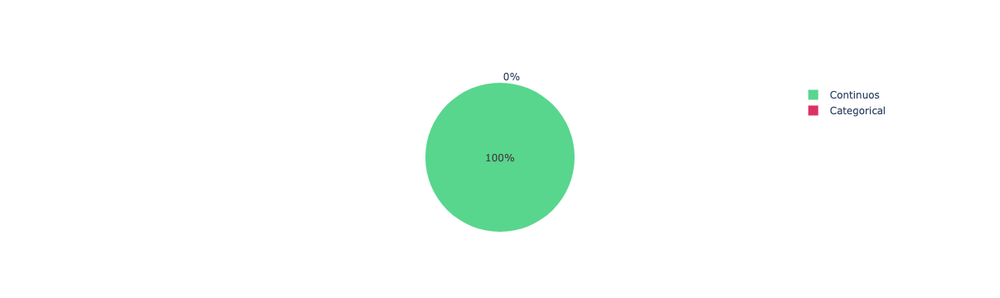

In [12]:
df = pd.concat([train[FEATURES], test[FEATURES]], axis=0)
cat_features = [col for col in FEATURES if df[col].nunique() < 25 ]
cont_features = [col for col in FEATURES if df[col].nunique() >= 25 ]

del df
print(f'\033[94mTotal number of features: {len(FEATURES)}')
print(f'\033[94mNumber of categorical features: {len(cat_features)}')
print(f'\033[94mNumber of continuos features: {len(cont_features)}')


labels=['Categorical', 'Continuos']
values= [len(cat_features), len(cont_features)]
colors = ['#DE3163', '#58D68D']

fig = go.Figure(data=[go.Pie(
    labels=labels, 
    values=values, 
    marker=dict(colors=colors, 
               )
)])
fig.show()

<a href="#toc" role="button" aria-pressed="true" >⬆️Back to Table of Contents ⬆️</a>

<a id="4.3"></a>
## <span style="color:#e76f51;"> Feature Distribution of Continous Features </span>


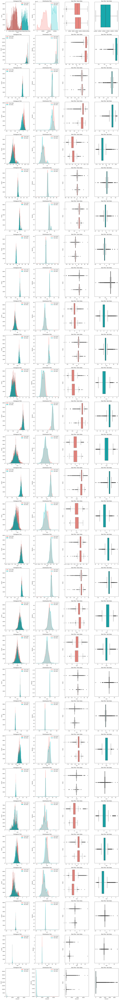

In [13]:
ncols = 4
nrows = len(cont_features)

fig, axes = plt.subplots(nrows, ncols, figsize=(18, 5*nrows))

for r in range(nrows):
    row = cont_features[r]
    
    
    sns.histplot(x=train[row], ax=axes[r,0], color='#F8766D', label='Train data' , fill =True )
    sns.histplot(x=test[row], ax=axes[r,0], color='#00BFC4', label='Test data', fill =True)
    
    sns.kdeplot(x=train[row], ax=axes[r,1], color='#F8766D', label='Train data' , fill =True )
    sns.kdeplot(x=test[row], ax=axes[r,1], color='#00BFC4', label='Test data', fill =True)
    
    sns.boxplot(x=train[row], y = train[TARGET], ax=axes[r,2], color='#F8766D', orient = "h")
    sns.boxplot(x=test[row], ax=axes[r,3], color='#00BFC4', orient = "h")
    
    axes[r,0].legend()
    axes[r,1].legend()
    axes[r,0].title.set_text("Histogram Plot")
    axes[r,1].title.set_text("Distribution Plot")
    axes[r,2].title.set_text("Box Plot- Train Data")
    axes[r,3].title.set_text("Box Plot- Test Data")
fig.tight_layout()
plt.show()

### <span style="color:#e76f51;">  Distribution of Amount </span>

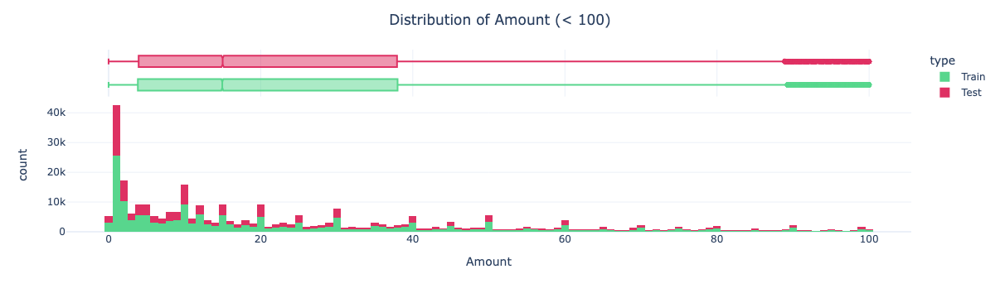

In [14]:
train_amount = train.copy()
test_amount = test.copy()
train_amount["type"] = "Train"
test_amount["type"] = "Test"
amountdf = pd.concat([train_amount, test_amount])
amountdf = amountdf[amountdf["Amount"]<100]
fig = px.histogram(data_frame = amountdf, 
                   x="Amount",
                   color= "type",
                   color_discrete_sequence =  ['#58D68D','#DE3163'],
                   marginal="box",
                   nbins= 100,
                    template="plotly_white"
                )
fig.update_layout(title = "Distribution of Amount (< 100)" , title_x = 0.5)
fig.show()

<a href="#toc" role="button" aria-pressed="true" >⬆️Back to Table of Contents ⬆️</a>

<a id="4.4"></a>
## <span style="color:#e76f51;">  Feature Distribution of Categorical Features </span>

* There are no categorical features 

<a href="#toc" role="button" aria-pressed="true" >⬆️Back to Table of Contents ⬆️</a>

<a id="4.5"></a>
## <span style="color:#e76f51;">  Target Distribution </span>

<div class="alert alert-block alert-info" style="font-size:14px; font-family:verdana; line-height: 1.7em;">
    📌 &nbsp;<b><u>Observations in Null Value Distribution :</u></b><br>
 
* <i>There are two target values - <b><u>0</u></b> and <b><u>1</u></b>(1 for fraudulent transactions, 0 otherwise).</i><br>
* <i>Fradulent transactions account for only <b><u>0.21%</u></b> of data. </i><br>
* <i>Targets are highly imbalanced.</i><br>
</div>

Percentage of Transported = 0: 99.79 %
Percentage of Transported = 1: 0.21 %


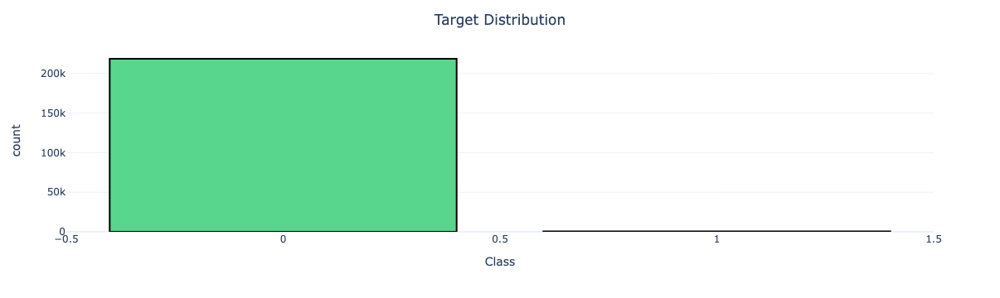

In [15]:
target_df = pd.DataFrame(train[TARGET].value_counts()).reset_index()
target_df.columns = [TARGET, 'count']
fig = px.bar(data_frame =target_df, 
             x = TARGET,
             y = 'count'
            ) 
fig.update_traces(marker_color =['#58D68D','#DE3163'], 
                  marker_line_color='rgb(0,0,0)',
                  marker_line_width=2,)
fig.update_layout(title = "Target Distribution",
                  template = "plotly_white",
                  title_x = 0.5)
print("\033[94mPercentage of Transported = 0: {:.2f} %".format(target_df["count"][0] *100 / train.shape[0]))
print("\033[94mPercentage of Transported = 1: {:.2f} %".format(target_df["count"][1]* 100 / train.shape[0]))
fig.show()

<a href="#toc" role="button" aria-pressed="true" >⬆️Back to Table of Contents ⬆️</a>

<a id="4.6"></a>
## <span style="color:#e76f51;">  Correlation matrix </span>

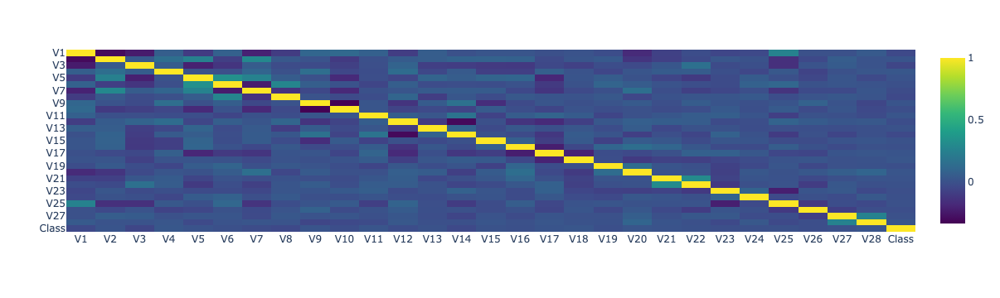

In [16]:
fig = px.imshow(train.drop(columns = ["Time", "Amount"]).corr() , aspect="auto" , color_continuous_scale = "viridis")
fig.show()

<a href="#toc" role="button" aria-pressed="true" >⬆️Back to Table of Contents ⬆️</a>

<a id="5"></a>
# **<center><span style="color:#00BFC4;">Data Pre-Processing  </span></center>**

In [17]:
## droping Time column
FEATURES.remove("Time")
train.drop(["Time" ] , axis = 1 ,inplace = True)
test.drop(["Time"] , axis = 1 ,inplace = True)
X = train.drop(TARGET , axis =1 )
y = train[TARGET]
X_train , X_test , y_train , y_test = train_test_split(X , 
                                                       y, 
                                                       random_state = 12 ,
                                                       test_size =0.33)

<a id="6"></a>
# **<center><span style="color:#00BFC4;">Modeling </span></center>**

<div class="alert alert-block alert-info" style="font-size:14px; font-family:verdana; line-height: 1.7em;">
    📌 &nbsp;<b><u>Observations in Target Modelling :</u></b><br>
    
* <i> <u><b>LGBMClassifier</u></b> , <u><b>CatBoostClassifier</u></b> and <u><b>XGBClassifier</u></b> used in modelling on 5-fold validation.</i><br>
* <i> Further Hyperparameter tuning can imporve the results.</i><br>
    
</div>

In [20]:
lgb_params = {
    'objective' : 'binary',
    'metric' : 'auc',
    'device' : 'cpu',
}


lgb_predictions = 0
lgb_scores = []
lgb_fimp = []

skf = StratifiedKFold(n_splits=FOLDS, shuffle=True, random_state=RANDOM_STATE)
for fold, (train_idx, valid_idx) in enumerate(skf.split(train[FEATURES], train[TARGET])):
    
    print(10*"=", f"Fold={fold+1}", 10*"=")
    start_time = time.time()
    
    X_train, X_valid = train.iloc[train_idx][FEATURES], train.iloc[valid_idx][FEATURES]
    y_train , y_valid = train[TARGET].iloc[train_idx] , train[TARGET].iloc[valid_idx]
    
    model = LGBMClassifier(**lgb_params)
    model.fit(X_train, y_train,verbose=0)
    
    preds_valid = model.predict_proba(X_valid)[:, 1]
    auc = roc_auc_score(y_valid,  preds_valid)
    lgb_scores.append(auc)
    run_time = time.time() - start_time
    
    print(f"Fold={fold+1}, AUC score: {auc:.2f}, Run Time: {run_time:.2f}s")
    fim = pd.DataFrame(index=FEATURES,
                 data=model.feature_importances_,
                 columns=[f'{fold}_importance'])
    lgb_fimp.append(fim)
    test_preds = model.predict_proba(test[FEATURES])[:, 1]
    lgb_predictions += test_preds/FOLDS
    
print("Mean AUC :", np.mean(lgb_scores))

========== Fold=1 ==========
Fold=1, AUC score: 0.65, Run Time: 1.22s
========== Fold=2 ==========
Fold=2, AUC score: 0.57, Run Time: 1.32s
========== Fold=3 ==========
Fold=3, AUC score: 0.61, Run Time: 1.50s
========== Fold=4 ==========
Fold=4, AUC score: 0.62, Run Time: 1.39s
========== Fold=5 ==========
Fold=5, AUC score: 0.62, Run Time: 1.61s
Mean AUC : 0.612185698186682


### <span style="color:#e76f51;">Feature Importance for LGBM Classifier (Top 15 Features) </span>

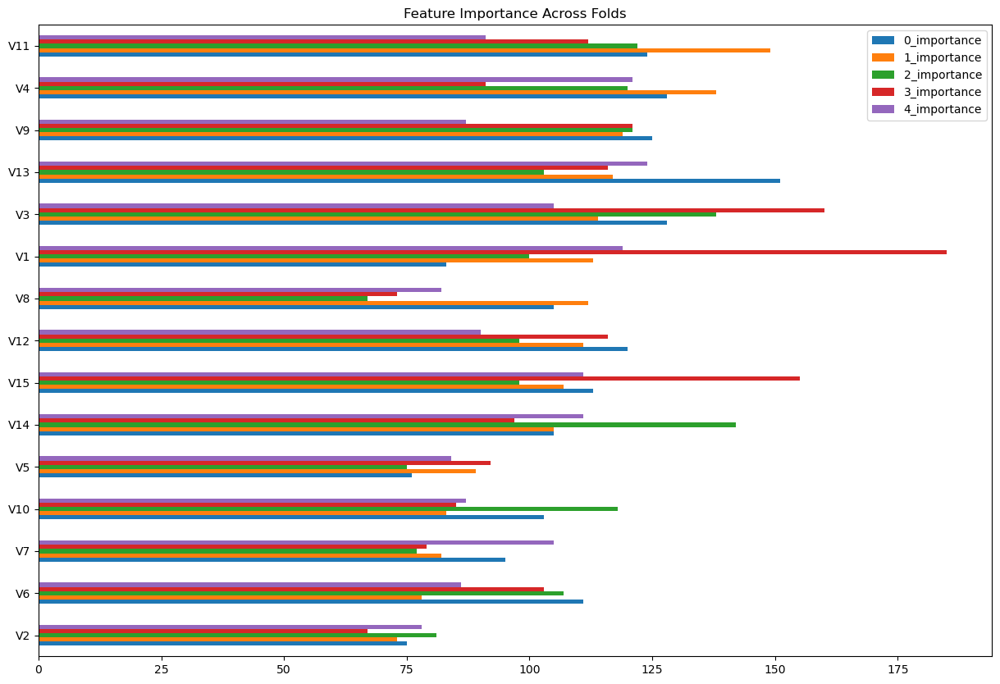

In [21]:
lgbm_fis_df = pd.concat(lgb_fimp, axis=1).head(15)
lgbm_fis_df.sort_values('1_importance').plot(kind='barh', figsize=(15, 10),
                                       title='Feature Importance Across Folds')
plt.show()

<a id="6.2"></a>
## <span style="color:#e76f51;"> XGBoost Classifier: </span>

In [26]:
xgb_params = {
    "objective":"binary:logistic",
    "eval_metric": "auc",
    "n_estimators": 1000,
    "random_state": 12,
    'tree_method': 'hist',
    'predictor': 'cpu_predictor',
}


xgb_predictions = 0
xgb_scores = []
xgb_fimp = []

skf = StratifiedKFold(n_splits=FOLDS, shuffle=True, random_state=RANDOM_STATE)
for fold, (train_idx, valid_idx) in enumerate(skf.split(train[FEATURES], train[TARGET])):
    
    print(10*"=", f"Fold={fold+1}", 10*"=")
    start_time = time.time()
    
    X_train, X_valid = train.iloc[train_idx][FEATURES], train.iloc[valid_idx][FEATURES]
    y_train , y_valid = train[TARGET].iloc[train_idx] , train[TARGET].iloc[valid_idx]
    
    model = XGBClassifier(**xgb_params)
    model.fit(X_train, y_train,verbose=0)
    
    preds_valid = model.predict_proba(X_valid)[:, 1]
    auc = roc_auc_score(y_valid,  preds_valid)
    xgb_scores.append(auc)
    run_time = time.time() - start_time
    
    print(f"Fold={fold+1}, AUC score: {auc:.2f}, Run Time: {run_time:.2f}s")
    test_preds = model.predict_proba(test[FEATURES])[:, 1]
    fim = pd.DataFrame(index=FEATURES,
                 data=model.feature_importances_,
                 columns=[f'{fold}_importance'])
    xgb_fimp.append(fim)
    xgb_predictions += test_preds/FOLDS
    
print("Mean AUC :", np.mean(xgb_scores))

========== Fold=1 ==========
Fold=1, AUC score: 0.76, Run Time: 6.79s
========== Fold=2 ==========
Fold=2, AUC score: 0.78, Run Time: 7.51s
========== Fold=3 ==========
Fold=3, AUC score: 0.72, Run Time: 8.03s
========== Fold=4 ==========
Fold=4, AUC score: 0.74, Run Time: 8.51s
========== Fold=5 ==========
Fold=5, AUC score: 0.79, Run Time: 8.46s
Mean AUC : 0.7575566210534693


In [ ]:
from sklearn.model_selection import GridSearchCV

# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [100, 500, 1000],  # Vary the number of trees
    'learning_rate': [0.01, 0.1, 0.2],  # Vary the learning rate
    'max_depth': [3, 4, 5],  # Vary the maximum depth of trees
    'gamma': [0, 1, 5],  # Vary the gamma parameter
}

# Create an XGBoost classifier
xgb = XGBClassifier(objective="binary:logistic", eval_metric="auc", random_state=12)

# Create a grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, scoring='roc_auc', cv=FOLDS)

# Fit the grid search to the data
grid_search.fit(train[FEATURES], train[TARGET])

# Print the best hyperparameters and corresponding ROC AUC score
print("Best Hyperparameters:", grid_search.best_params_)
print("Best ROC AUC Score:", grid_search.best_score_)

# Get the best model with the optimal hyperparameters
best_xgb = grid_search.best_estimator_

# Now you can use the best model for predictions
xgb_predictions = best_xgb.predict_proba(test[FEATURES])[:, 1]

### <span style="color:#e76f51;">Feature Importance for XGBoost Classifier (Top 15 Features) </span>

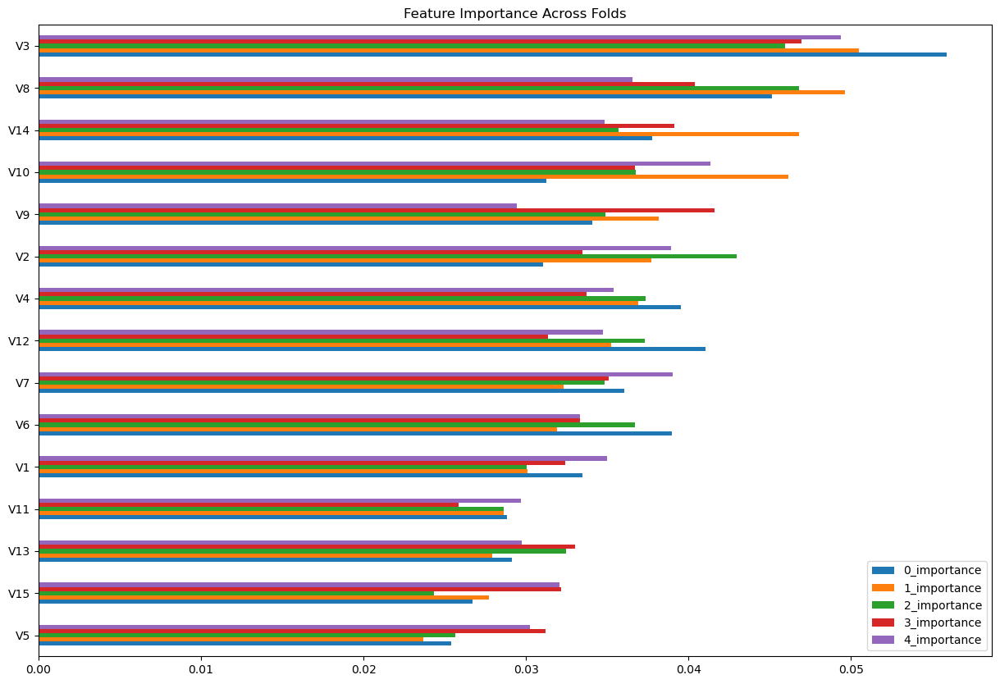

In [27]:
xgb_fis_df = pd.concat(xgb_fimp, axis=1).head(15)
xgb_fis_df.sort_values('1_importance').plot(kind='barh', figsize=(15, 10),
                                       title='Feature Importance Across Folds')
plt.show()

<a id="7"></a>
# **<center><span style="color:#00BFC4;">Submission </span></center>**

### <span style="color:#e76f51;">LGBM Classifier Submission : </span>

In [28]:
lgb_submission = submission.copy()
lgb_submission[TARGET] = lgb_predictions
lgb_submission.to_csv("lgb-subs.csv",index=False)
lgb_submission.head()

,id,Class
0,219129,0.000030
1,219130,0.200011
2,219131,0.000009
3,219132,0.000025
4,219133,0.000032


### <span style="color:#e76f51;">XGBoost Classifier Submission : </span>

In [29]:
xgb_submission = submission.copy()
xgb_submission[TARGET] = xgb_predictions
xgb_submission.to_csv("xgb-subs.csv",index=False)
xgb_submission.head()

,id,Class
0,219129,9.015619e-07
1,219130,1.010354e-05
2,219131,1.803005e-06
3,219132,5.147526e-05
4,219133,1.238133e-05


<a href="#toc" role="button" aria-pressed="true" >⬆️Back to Table of Contents ⬆️</a>

<div class="alert alert-block alert-info" style="font-size:14px; font-family:verdana; line-height: 1.7em;">
    
    
### <center>Thank you for reading🙂</center>
### <center>If you have any feedback or find anything wrong, please let me know!</center>
